#### Analiza danych emg dla przenoszenia nieprawidłowego

In [2]:
import sys

sys.path.append("..")

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import glob
from matplotlib.pyplot import subplot
from matplotlib.pyplot import figure
from IPython.display import set_matplotlib_formats

set_matplotlib_formats("svg")
mpl.rcParams["axes.spines.right"] = False
mpl.rcParams["axes.spines.top"] = False
plt.style.use("seaborn-ticks")
%matplotlib inline
from pyomeca import Analogs

from ezc3d import c3d

In [3]:
data_path = "../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T01.c3d"
data_path2 = "../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T02.c3d"
data_path3 = "../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T03.c3d"
data_path4 = "../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T01.c3d"
data_path5 = "../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T02.c3d"
data_path6 = "../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T03.c3d"

In [4]:
muscles_names = [
    "Biodrowo-żebrowy - wyżej L",
    "Biodrowo-żebrowy - niżej L", 
    "Skośny brzucha L", 
    "Prosty uda L",
    "Dwugłowy uda L", 
    "Brzuchaty łydki - głowa boczna L",
    "Brzuchaty łydki - głowa przyśrodkowa L", 
    "Płaszczowy L",
    "Biodrowo-żebrowy - wyżej P",
    "Biodrowo-żebrowy - niżej P", 
    "Skośny brzucha P", 
    "Prosty uda P",
    "Dwugłowy uda P", 
    "Brzuchaty łydki - głowa boczna P",
    "Brzuchaty łydki - głowa przyśrodkowa P", 
    "Płaszczowy P",]

def read_analogs(data_path):
    muscles = [
    "Voltage.1",
    "Voltage.2",
    "Voltage.3",
    "Voltage.4",
    "Voltage.5",
    "Voltage.6",
    "Voltage.7",
    "Voltage.8",
    "Voltage.9",
    "Voltage.10",
    "Voltage.11",
    "Voltage.12",
    "Voltage.13",
    "Voltage.14",
    "Voltage.15",
    "Voltage.16"]
    
    emg = Analogs.from_c3d(data_path, usecols=muscles)
    
    emg['channel']=muscles_names
    return emg

In [5]:
def show_emg_data(data_to_show):
    data_to_show.plot(x="time", col="channel", col_wrap=3)

In [6]:
def normalize_data(data_path):
    emg_p = (
        data_path.meca.band_pass(order=2, cutoff=[10, 425])
        .meca.center()
        .meca.abs()
        .meca.low_pass(order=4, cutoff=5, freq=data_path.rate)
        .meca.normalize(ref=None, scale=1)
    ) 
    emg_p.name = "EMG"
    emg_p.attrs["units"] = "%"
    emg_p.time.attrs["units"] = "seconds"
    return emg_p

In [7]:
def read_events(data_path):
    c3d_to_compare= c3d(data_path)
    event_time = c3d_to_compare['parameters']['EVENT']['TIMES']['value'][1]
    
    return event_time

In [8]:
## Dane przed normalizacją
readed_emg = read_analogs(data_path)
readed_emg2 = read_analogs(data_path2)
readed_emg3 = read_analogs(data_path3)
readed_emg4 = read_analogs(data_path4)
readed_emg5 = read_analogs(data_path5)
readed_emg6 = read_analogs(data_path6)

In [9]:
## Dane po normalizacji
emg_processed = normalize_data(readed_emg)
emg_processed2 = normalize_data(readed_emg2)
emg_processed3 = normalize_data(readed_emg3)
emg_processed4 = normalize_data(readed_emg4)
emg_processed5 = normalize_data(readed_emg5)
emg_processed6 = normalize_data(readed_emg6)

In [10]:
## Odczytanie event'ów
event_time = read_events(data_path)
print(event_time)

[ 7.80999994 10.51000023 10.52000046 12.34000015 12.76000023 14.71000004]


In [11]:
event_time2 = read_events(data_path2)
print(event_time2)

[ 8.22999954 10.46000004 10.47000027 13.93000031 14.17000008 18.02000046]


In [12]:
event_time3 = read_events(data_path3)
print(event_time3)

[ 6.32000017  8.28999996  8.30000019 13.76000023]


In [13]:
event_time4 = read_events(data_path4)
print(event_time4)

[ 4.78000021  6.05999994  6.07000017 10.25       10.59000015 12.89000034]


In [14]:
event_time5 = read_events(data_path5)
print(event_time5)

[ 4.92000008  6.84000015  6.88999987  9.40999985 10.09000015 12.84000015]


In [15]:
event_time6 = read_events(data_path6)
print(event_time6)

[ 4.17000008  6.11999989  6.19000006  8.38000011  8.82999992 10.27999973]


In [16]:
def compare_events_average(path, emg_processed, event_time):
         
    aver_arr_all=np.zeros((16,1000))
    
    for file in glob.glob(path,recursive = True):
        print(file)

        aver_arr=np.zeros((16,1000))  
        file_num=0

        for num in range(16):

            emg_processed_event=emg_processed[num]
            emg_processed_event2 = (
            emg_processed_event.meca.normalize(ref=None, scale=1)                
            )
            time_normalized=emg_processed_event2.meca.time_normalize(n_frames=1000)
            
            c3d_to_compare= c3d(file)
            n_frames = c3d_to_compare['parameters']['POINT']['FRAMES']['value'][0]
            nn = n_frames/1000
            markevent = event_time/nn*100

            for t in range(1000):
                aver_arr[num][t]=aver_arr[num][t]+time_normalized.values[t]

            aver_arr[num]=aver_arr[num]/10

            for t2 in range(1000):
                aver_arr_all[file_num][t2]=aver_arr_all[file_num][t2]+time_normalized.values[t2]
            file_num=file_num+1;
        
    return aver_arr_all, markevent

In [17]:
aver_arr1, get_markevent1 = compare_events_average(data_path, emg_processed, event_time)
aver_arr2, get_markevent2 = compare_events_average(data_path2, emg_processed2, event_time2)
aver_arr3, get_markevent3 = compare_events_average(data_path3, emg_processed3, event_time3)
aver_arr4, get_markevent4 = compare_events_average(data_path4, emg_processed4, event_time4)
aver_arr5, get_markevent5 = compare_events_average(data_path5, emg_processed5, event_time5)
aver_arr6, get_markevent6 = compare_events_average(data_path6, emg_processed6, event_time6)

../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T01.c3d
../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T02.c3d
../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T03.c3d
../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T01.c3d
../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T02.c3d
../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T03.c3d


In [18]:
def plot_compare_events_average(path, aver_arr_all, event_time, markevent, index):
    
    for file in glob.glob(path,recursive = True):
        print(file)
    
        for num in range(16):
            
            subplot(1, 2, 1)
            plt.subplots_adjust(left=0.125,
                        bottom=0.1, 
                        right=5, 
                        top=0.25, 
                        wspace=0.25, 
                        hspace=0.35)
            time=np.linspace(1,1000,1000)
            plt.plot(time,aver_arr_all[num])
            axl = 0
            for axl in range(index):
                if(axl == 0 or axl == 2 or axl == 4 or axl == 6 or axl == 8 or axl == 10 or axl == 12):
                    plt.axvline(markevent[axl], color='g')
                else:
                    plt.axvline(markevent[axl], color='r')
            plt.title(muscles_names[num])
            plt.axhline(0.25, color='k', linestyle='--')
            plt.fill_between(time,aver_arr_all[num])
            plt.show()

../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T01.c3d


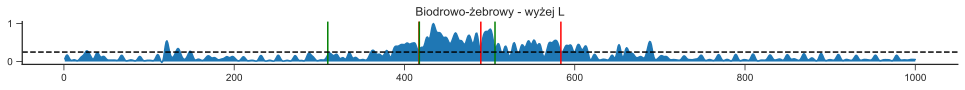

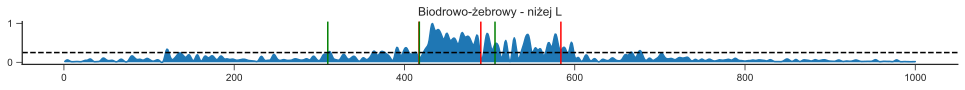

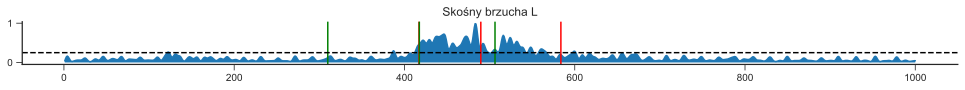

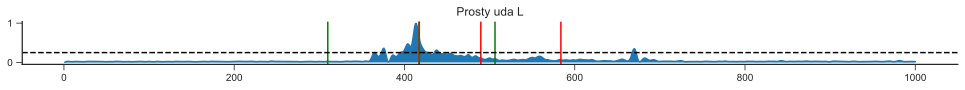

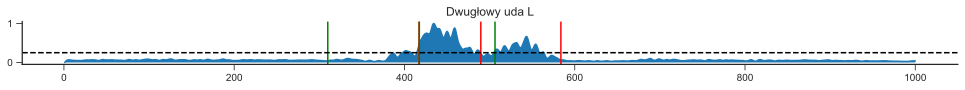

...

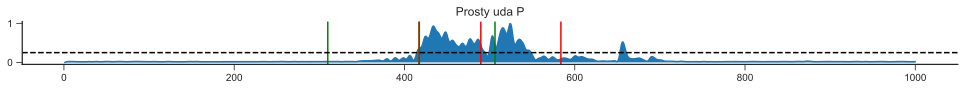

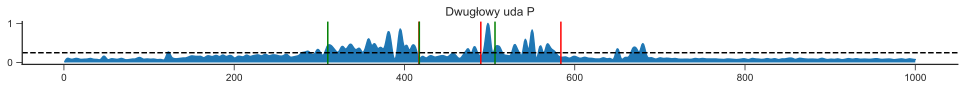

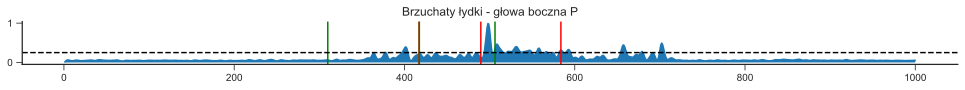

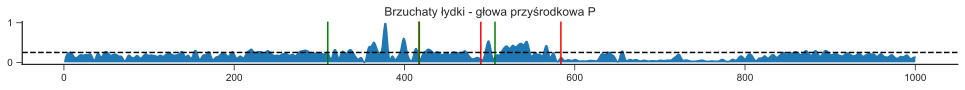

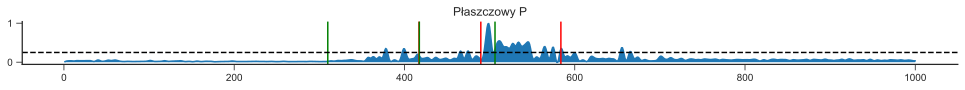

../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T02.c3d


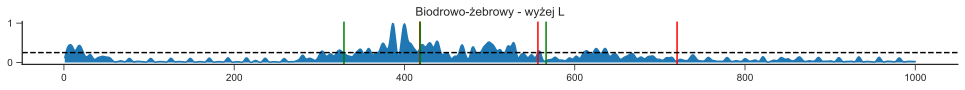

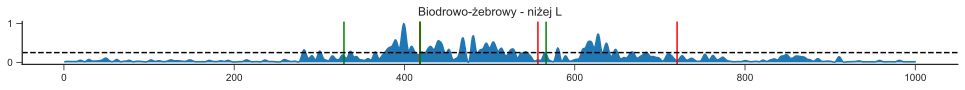

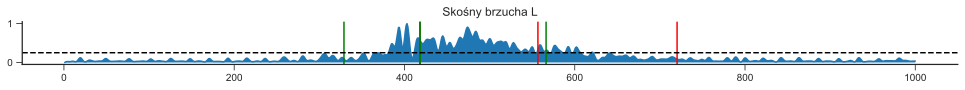

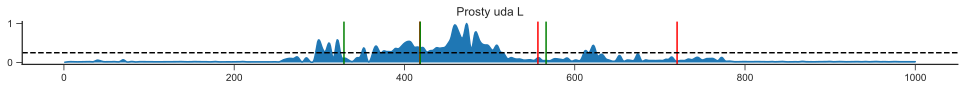

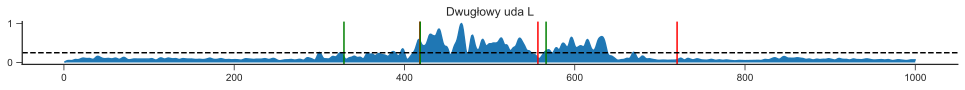

...

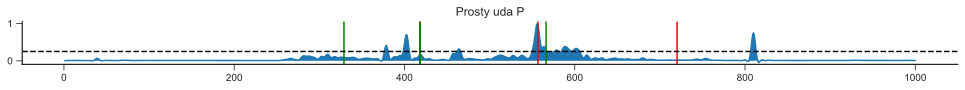

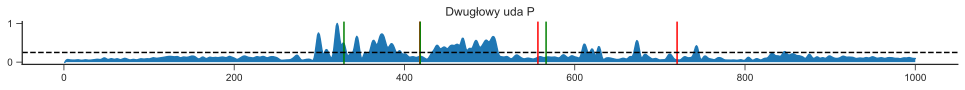

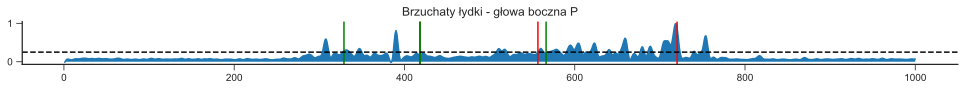

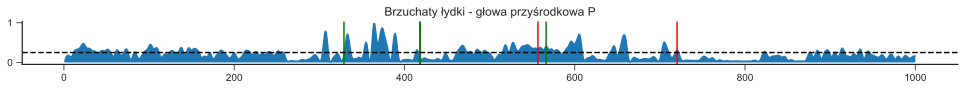

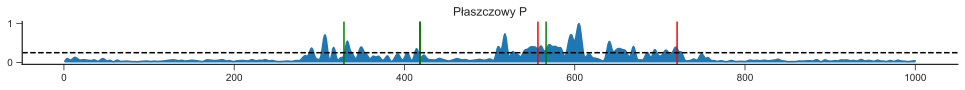

../Jupyter/c3d/B0437 PrzenoszenieNieprawidlowe T03.c3d


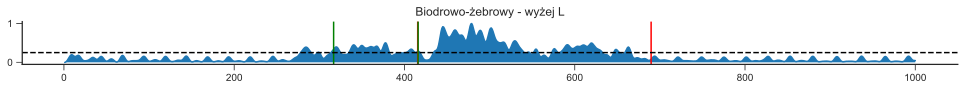

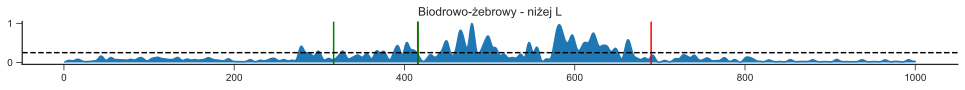

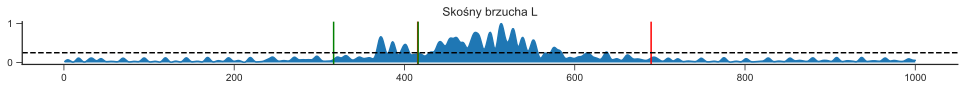

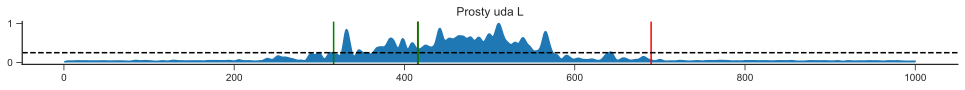

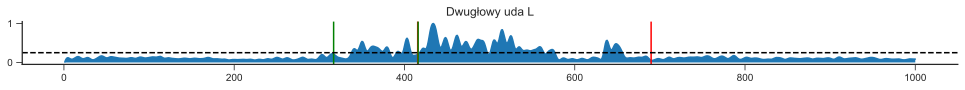

...

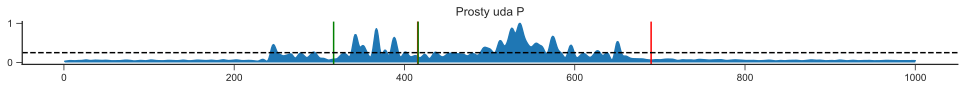

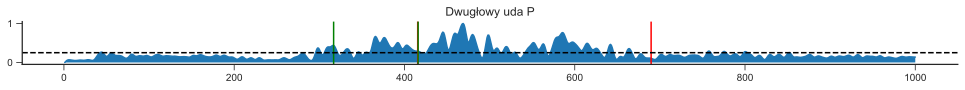

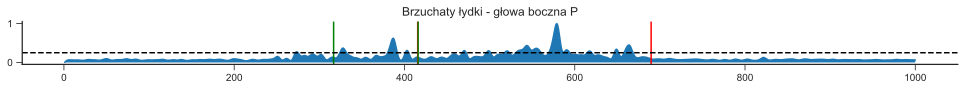

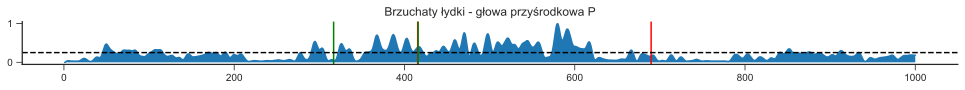

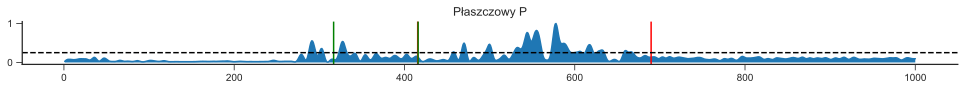

../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T01.c3d


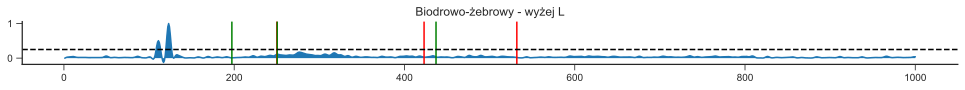

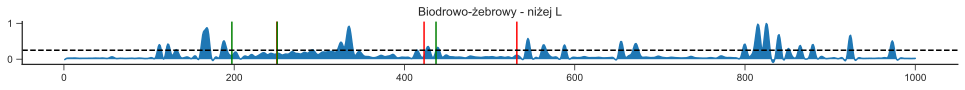

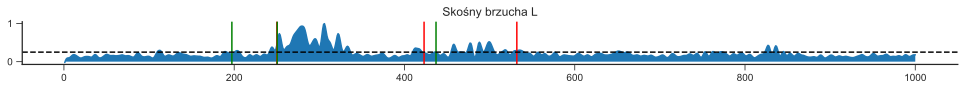

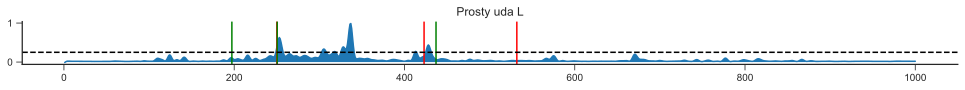

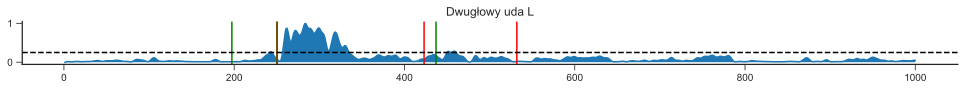

...

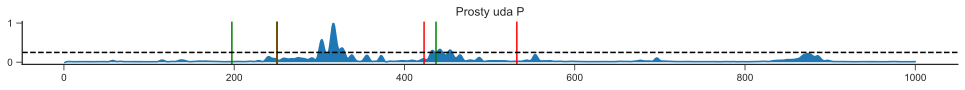

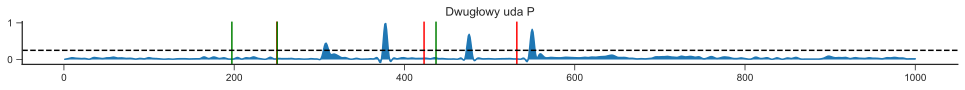

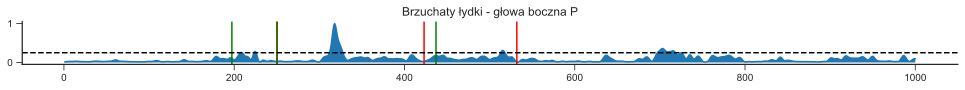

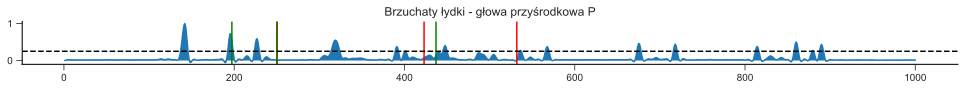

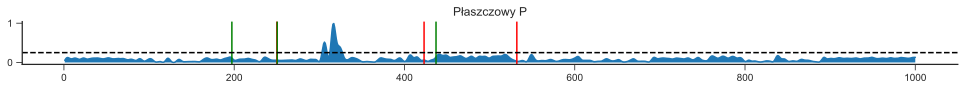

../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T02.c3d


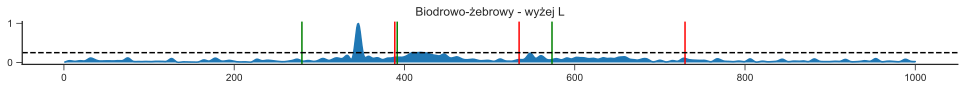

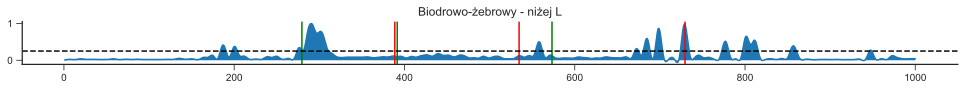

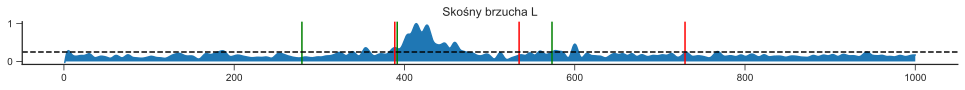

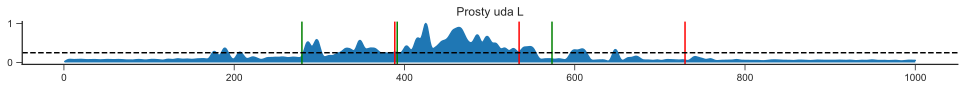

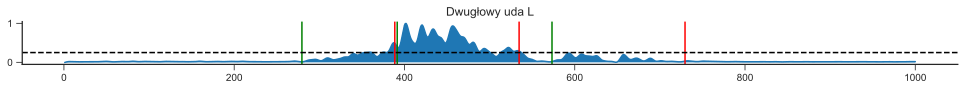

...

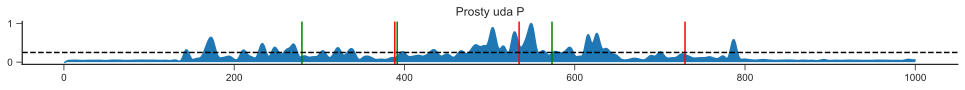

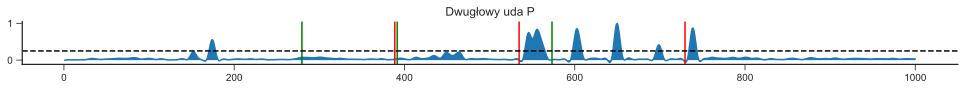

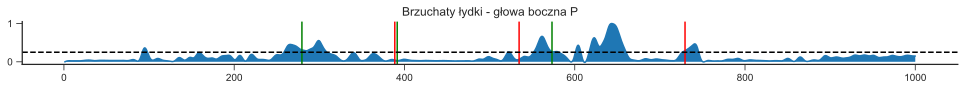

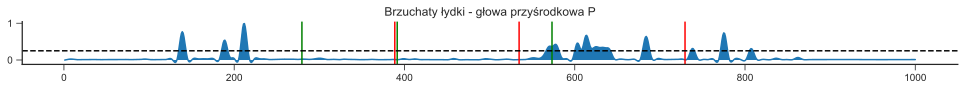

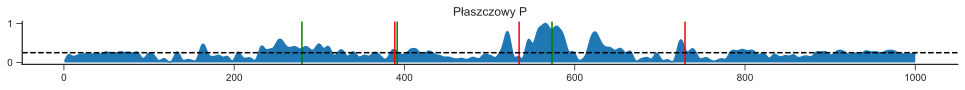

../Jupyter/c3d/B0436 PrzenoszenieNieprawidlowe T03.c3d


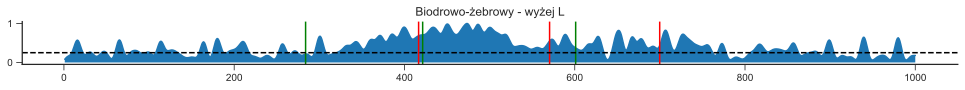

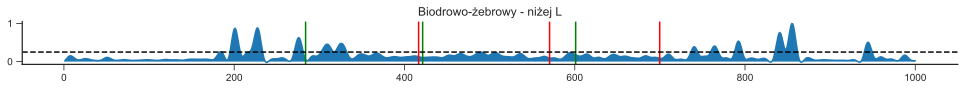

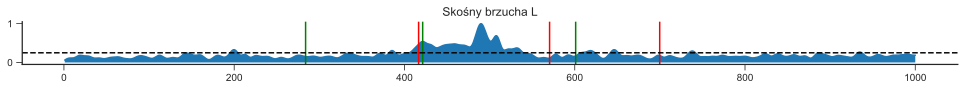

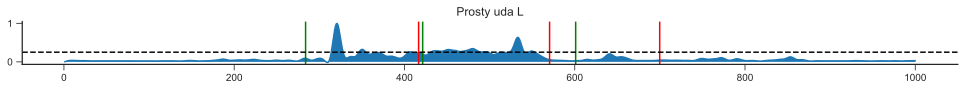

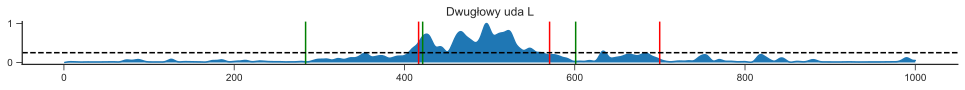

...

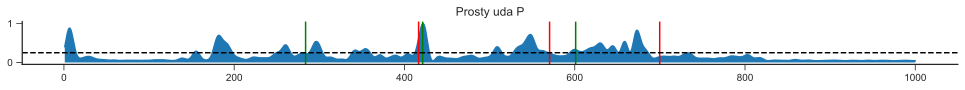

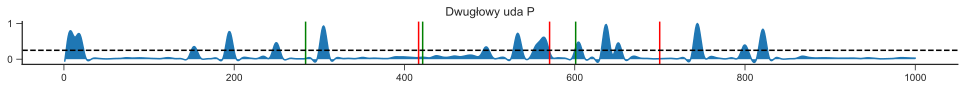

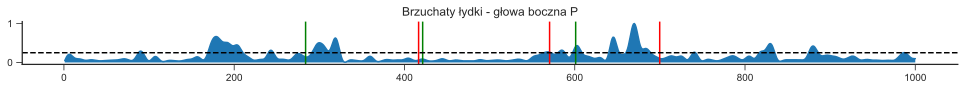

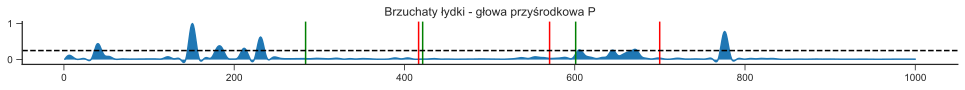

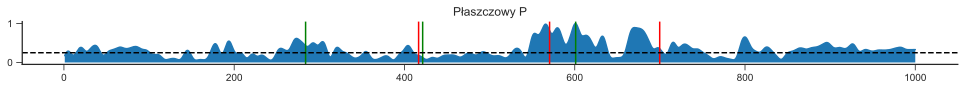

In [19]:
plot_compare_events_average(data_path, aver_arr1, event_time, get_markevent1, 6)
plot_compare_events_average(data_path2, aver_arr2, event_time2, get_markevent2, 6)
plot_compare_events_average(data_path3, aver_arr3, event_time3, get_markevent3, 4)
plot_compare_events_average(data_path4, aver_arr4, event_time4, get_markevent4, 6)
plot_compare_events_average(data_path5, aver_arr5, event_time5, get_markevent5, 6)
plot_compare_events_average(data_path6, aver_arr6, event_time6, get_markevent6, 6)

In [20]:
def plot_all(actor):
    time=np.linspace(1,1000,1000)
    aver_arr_all=np.zeros((16,1000))

    for num in range(16):
        subplot(1, 2, 1)
        plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=5, 
                    top=0.5, 
                    wspace=0.25, 
                    hspace=0.35)
        if(actor == 'B0437'):
            plt.plot(time,aver_arr1[num], label = "B0437 PrzenoszenieNieprawidlowe T01")
            plt.plot(time,aver_arr2[num], label = "B0437 PrzenoszenieNieprawidlowe T02")
            plt.plot(time,aver_arr3[num], label = "B0437 PrzenoszenieNieprawidlowe T03")
        if(actor == 'B0436'):
            plt.plot(time,aver_arr4[num], label = "B0436 PrzenoszenieNieprawidlowe T01")
            plt.plot(time,aver_arr5[num], label = "B0436 PrzenoszenieNieprawidlowe T02")
            plt.plot(time,aver_arr6[num], label = "B0436 PrzenoszenieNieprawidlowe T03")
        plt.title(muscles_names[num])
        plt.legend(loc='right', borderaxespad=-10) 
        plt.show()

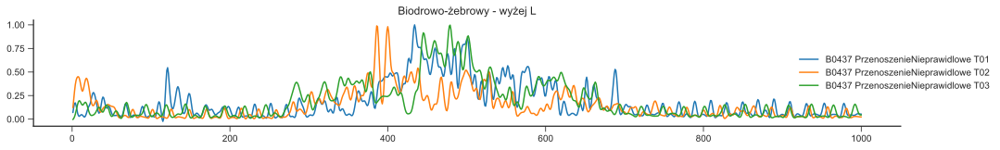

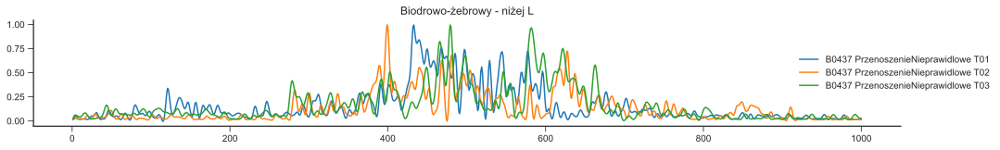

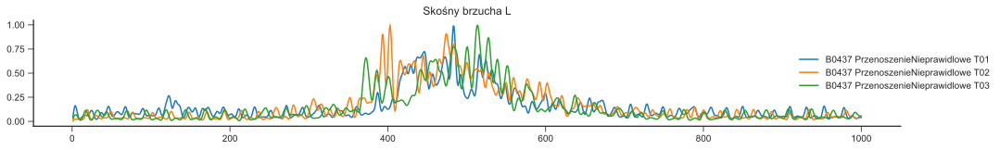

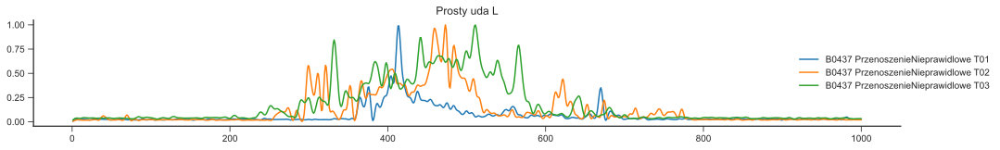

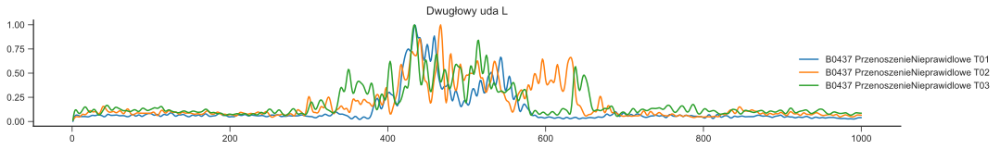

...

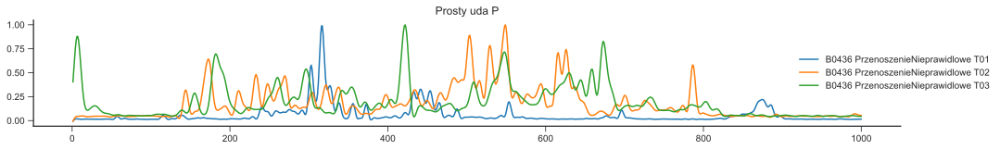

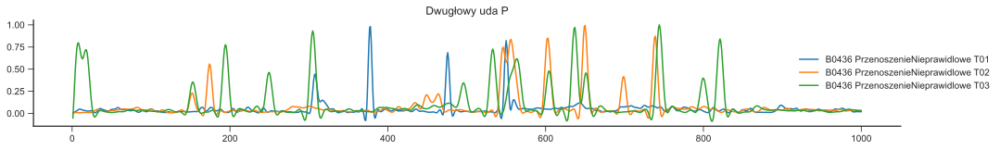

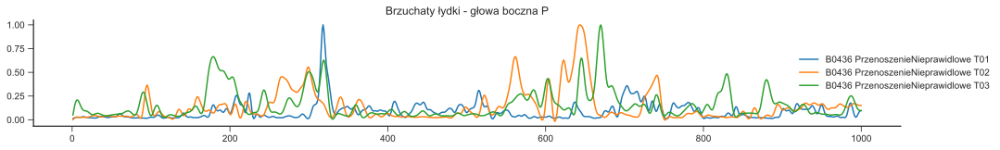

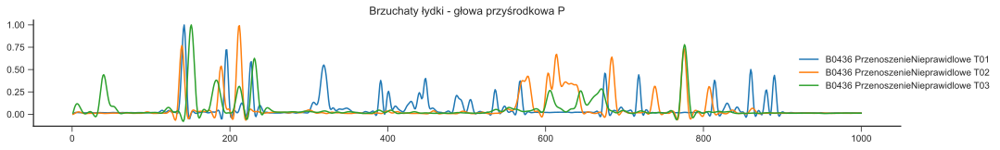

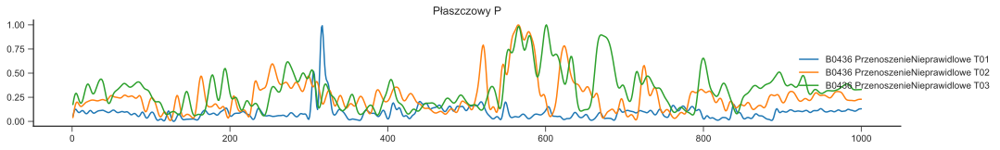

In [21]:
plot_all('B0437')
plot_all('B0436')